# Lab 4 : Dry Beans

**Muchiri Kahwai**  
**Lab Partner:** Arthur Melo  
**DSC 305 S23**  
**Lab 4: Dry Beans**



## Import Libraries

To perform the analysis, we imported several libraries that are essential for data processing and analysis. Pandas was used for data manipulation, including reading data from a CSV file and storing it in a DataFrame object. Numpy was used for numerical computations and linear algebra operations. We also used data visualization libraries such as Matplotlib and Seaborn to create informative visualizations. Additionally, we utilized scipy.stats for statistical analysis. Finally, we used scikit-learn libraries such as MinMaxScaler, StandardScaler, RFECV, RandomForestClassifier, and StratifiedKFold for preprocessing, feature selection, and machine learning model development.

In [64]:
# Importing relevant libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pycountry_convert as pc
import scipy.stats as stats
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.feature_selection import RFECV
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold

# Exploratory Data Analysis

### Import the Dataset

Afterward, we proceed to import the CSV file into our program. For this purpose, we utilize the Pandas library to read and load the dataset into a DataFrame data structure.

In [65]:

drybeansdata = pd.read_excel("Dry_Bean_Dataset.xlsx")

drybeansdata.head()       

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


In [66]:
# Summary of the dataset
print(drybeansdata.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

The Dry Bean dataset consists of 13,611 non-null samples, with each sample representing a dry bean instance characterized by 16 features. the attributes are divided into integer and floating-point numerical data types as follows:

Integers (int64):

1. Area
2. ConvexArea

Floating-point (float64):

1. Perimeter
2. MajorAxisLength
3. MinorAxisLength
4. AspectRation
5. Eccentricity
6. EquivDiameter
7. Extent
8. Solidity
9. roundness
10. Compactness
11. ShapeFactor1
12. ShapeFactor2
13. ShapeFactor3
14. ShapeFactor4

- These attributes together describe the geometric properties of the dry beans and can be used to classify them into their respective types.

- The 'Class' column, which is of the object data type, signifies the categorical variable denoting the bean variety. It comprises seven distinct classes, each corresponding to one of the seven dry bean types.






In [67]:
# Get shape of the dataset
drybeansdata.shape

(13611, 17)

This indicates that the dataset contains 13,611 rows and 17 columns. This means that there are 13,611 instances (samples) of dry beans in the dataset, and each instance is described by 16 features along with the target variable 'Class', making a total of 17 columns.

In [68]:
#Get column names
drybeansdata.columns

Index(['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
       'AspectRation', 'Eccentricity', 'ConvexArea', 'EquivDiameter', 'Extent',
       'Solidity', 'roundness', 'Compactness', 'ShapeFactor1', 'ShapeFactor2',
       'ShapeFactor3', 'ShapeFactor4', 'Class'],
      dtype='object')

These column names represent the features and target variable present in the dataset. The features include 'Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength', 'AspectRation', 'Eccentricity', 'ConvexArea', 'EquivDiameter', 'Extent', 'Solidity', 'roundness', 'Compactness', 'ShapeFactor1', 'ShapeFactor2', 'ShapeFactor3', and 'ShapeFactor4'. The target variable, 'Class', represents the type of dry bean. Each of these columns contains information about the various geometric and morphological properties of the dry beans, which can be used to classify them into their respective types.

## Summary Statistics and Missing Values

In [69]:
# Display basic statistics of the dataset
drybeansdata.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,254616.000000,1985.370000,738.860153,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


- Area: The average bean area is 53,048 square units, with a standard deviation of 29,324 square units. The smallest bean has an area of 20,420 square units, while the largest one has an area of 254,616 square units. This indicates that there is a considerable variation in bean sizes. Beans can range from small to significantly large, with some beans having more than four times the area of the smaller ones.
- Perimeter: Bean perimeters range from 524.736 to 1985.37 units, with an average value of 855.283 and a standard deviation of 214.29 units. This suggests that the perimeters of beans in the dataset are quite diverse, indicating differences in shapes and sizes among the beans.
- MajorAxisLength and MinorAxisLength: The average lengths of the major and minor axes are 320.14 and 202.27 units, respectively. They have standard deviations of 85.69 and 44.97 units, respectively. This indicates that the lengths of the major and minor axes also vary widely, which is consistent with the variation observed in the bean sizes.
- AspectRation: Beans have an average aspect ratio of 1.583, with a standard deviation of 0.247. The aspect ratio varies from 1.025 to 2.430.This suggests that the beans' shapes also differ, with some beans being more elongated than others.
- Eccentricity: The average bean eccentricity is 0.751, with a standard deviation of 0.092. The values range from 0.219 to 0.911. This indicates that the dataset contains beans with a range of different shapes, from more circular to more elongated.
- ConvexArea: The average convex area of the beans is 53,768 square units, with a standard deviation of 29,775 square units. The convex area values range from 20,684 to 263,261 square units.This implies that there is considerable variation in the convex areas of beans, similar to the variation observed in bean sizes.
- EquivDiameter: Beans have an average equivalent diameter of 253.06 units, with a standard deviation of 59.18 units. The equivalent diameter ranges from 161.24 to 569.37 units.This suggests that the equivalent diameters of the beans also vary significantly, which is in line with the other size-related features.
- Extent: The average extent value is 0.750, with a standard deviation of 0.049. The values range from 0.555 to 0.866.
- Solidity: The average solidity value is 0.987, with a standard deviation of 0.005. Solidity values range from 0.919 to 0.995.
- roundness: The average roundness value is 0.873, with a standard deviation of 0.060. Roundness values range from 0.490 to 0.991.This suggests that the roundness of beans varies, with some beans having more circular shapes, while others are more irregular.
- Compactness: Beans have an average compactness value of 0.800, with a standard deviation of 0.062. The compactness values range from 0.641 to 0.987. This indicates that the beans in the dataset exhibit a range of compactness values, with some being more compact than others.
- ShapeFactor1, ShapeFactor2, ShapeFactor3, and ShapeFactor4: These features have different ranges and standard deviations. For example, ShapeFactor1 has a mean of 0.00656 and a standard deviation of 0.00113, while ShapeFactor4 has a mean of 0.995 and a standard deviation of 0.00437. The ShapeFactor features have different ranges and standard deviations, indicating that the beans' shapes vary across multiple dimensions









In [70]:
# Check for missing values
print(drybeansdata.isnull().sum())

# Check for duplicate rows
print("The number of duplicate rows before cleaning is :", drybeansdata.duplicated().sum())

# Drop duplicates
drybeansdata.drop_duplicates(inplace=True)
print("The number of duplicates rows after cleaning:", drybeansdata.duplicated().sum())

Area               0
Perimeter          0
MajorAxisLength    0
MinorAxisLength    0
AspectRation       0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Solidity           0
roundness          0
Compactness        0
ShapeFactor1       0
ShapeFactor2       0
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64
The number of duplicate rows before cleaning is : 68
The number of duplicates rows after cleaning: 0


In [71]:
# Select only the numeric columns
numeric_columns = drybeansdata.select_dtypes(include=np.number).columns

# Perform the Shapiro-Wilk test on each numeric column and print the results
print("Shapiro-Wilk Test Results:")
for column in numeric_columns:
    shapiro_test = stats.shapiro(drybeansdata[column])
    print(f"{column} - Test Statistic: {shapiro_test[0]:.4f}, p-value: {shapiro_test[1]:.4f}")

Shapiro-Wilk Test Results:
Area - Test Statistic: 0.6969, p-value: 0.0000
Perimeter - Test Statistic: 0.8647, p-value: 0.0000
MajorAxisLength - Test Statistic: 0.8864, p-value: 0.0000
MinorAxisLength - Test Statistic: 0.7992, p-value: 0.0000
AspectRation - Test Statistic: 0.9678, p-value: 0.0000
Eccentricity - Test Statistic: 0.9309, p-value: 0.0000
ConvexArea - Test Statistic: 0.6983, p-value: 0.0000
EquivDiameter - Test Statistic: 0.8336, p-value: 0.0000
Extent - Test Statistic: 0.9456, p-value: 0.0000
Solidity - Test Statistic: 0.8104, p-value: 0.0000
roundness - Test Statistic: 0.9687, p-value: 0.0000
Compactness - Test Statistic: 0.9891, p-value: 0.0000
ShapeFactor1 - Test Statistic: 0.9761, p-value: 0.0000
ShapeFactor2 - Test Statistic: 0.9654, p-value: 0.0000
ShapeFactor3 - Test Statistic: 0.9859, p-value: 0.0000
ShapeFactor4 - Test Statistic: 0.7633, p-value: 0.0000


C:\Users\kahwa\AppData\Local\Programs\Python\Python310\lib\site-packages\scipy\stats\_morestats.py:1816: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


All the p-values are 0.0000, which means that the null hypothesis (the data is normally distributed) can be rejected for all the columns. This suggests that the data in these columns is not normally distributed. The test statistic values also support this finding, as most of them are far from 1.

In conclusion, based on the Shapiro-Wilk test results, the data in the columns tested does not come from a normally distributed population.

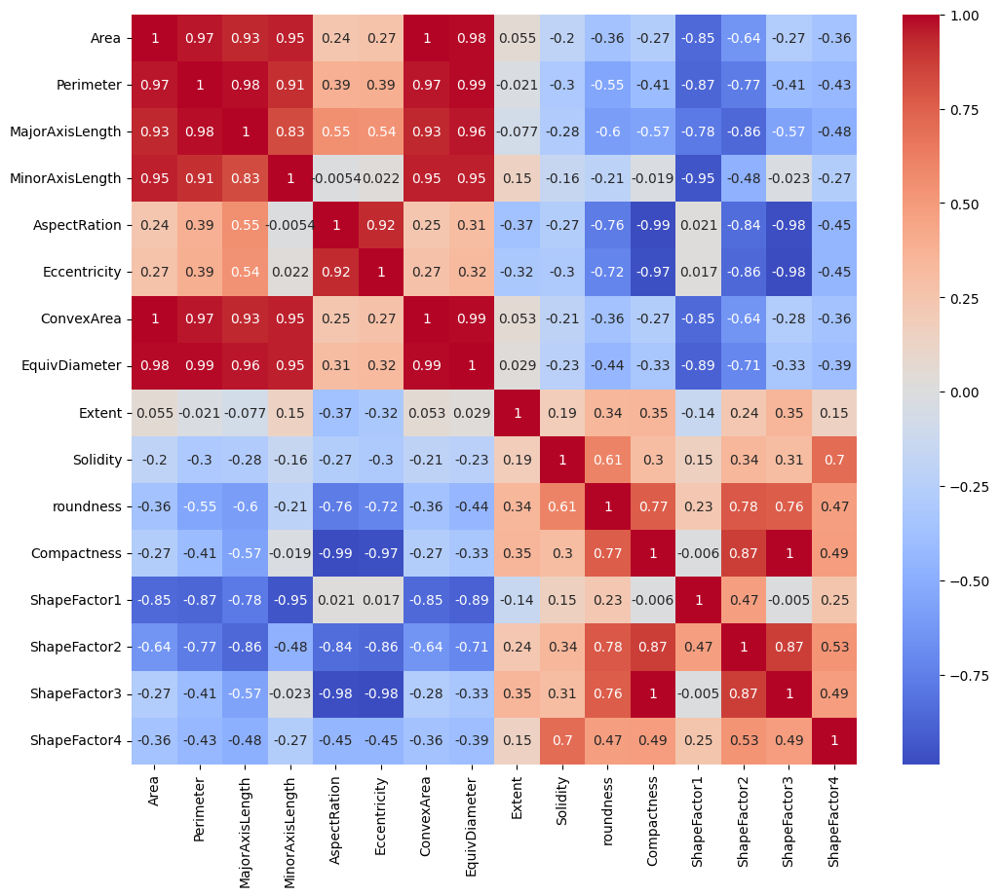

In [72]:
# Creating a heatmap
corr_matrix = drybeansdata.corr(numeric_only=True)
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.show()

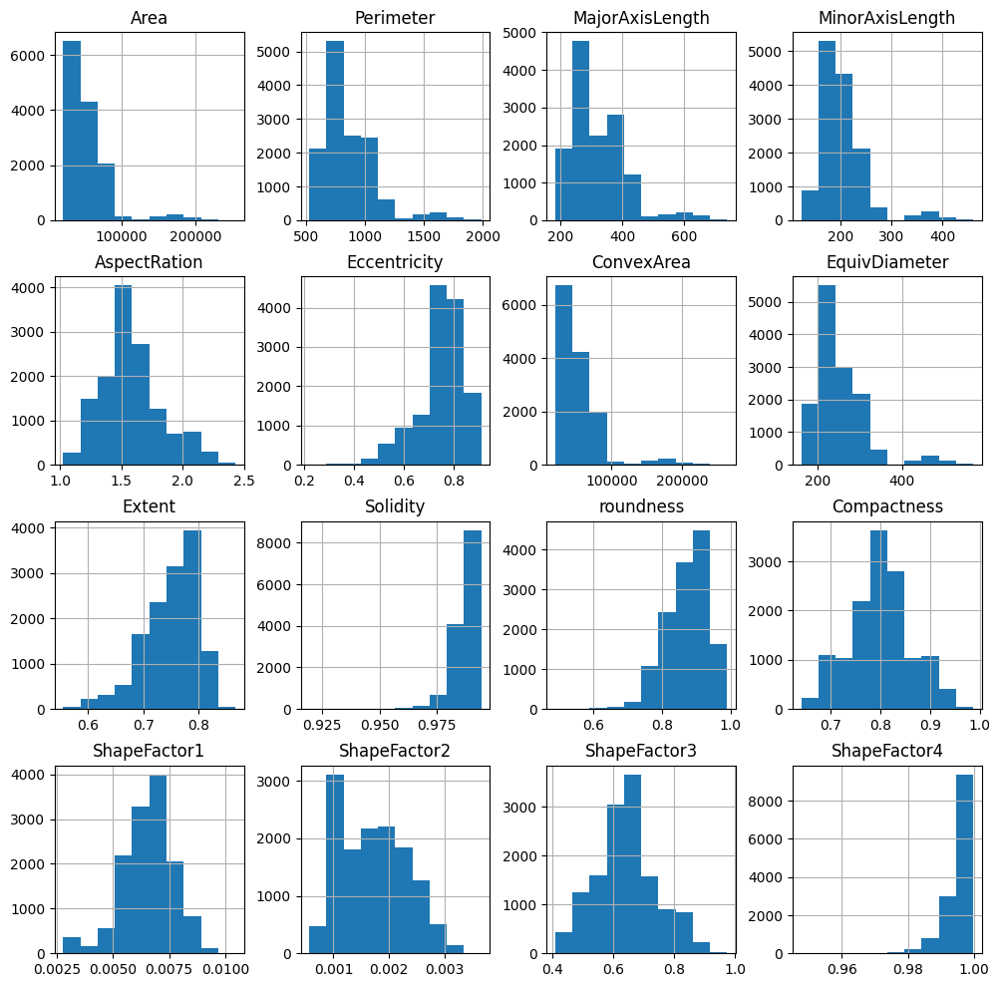

In [73]:
# Creating a Histogram
drybeansdata.hist(figsize=(12, 12))
plt.show()

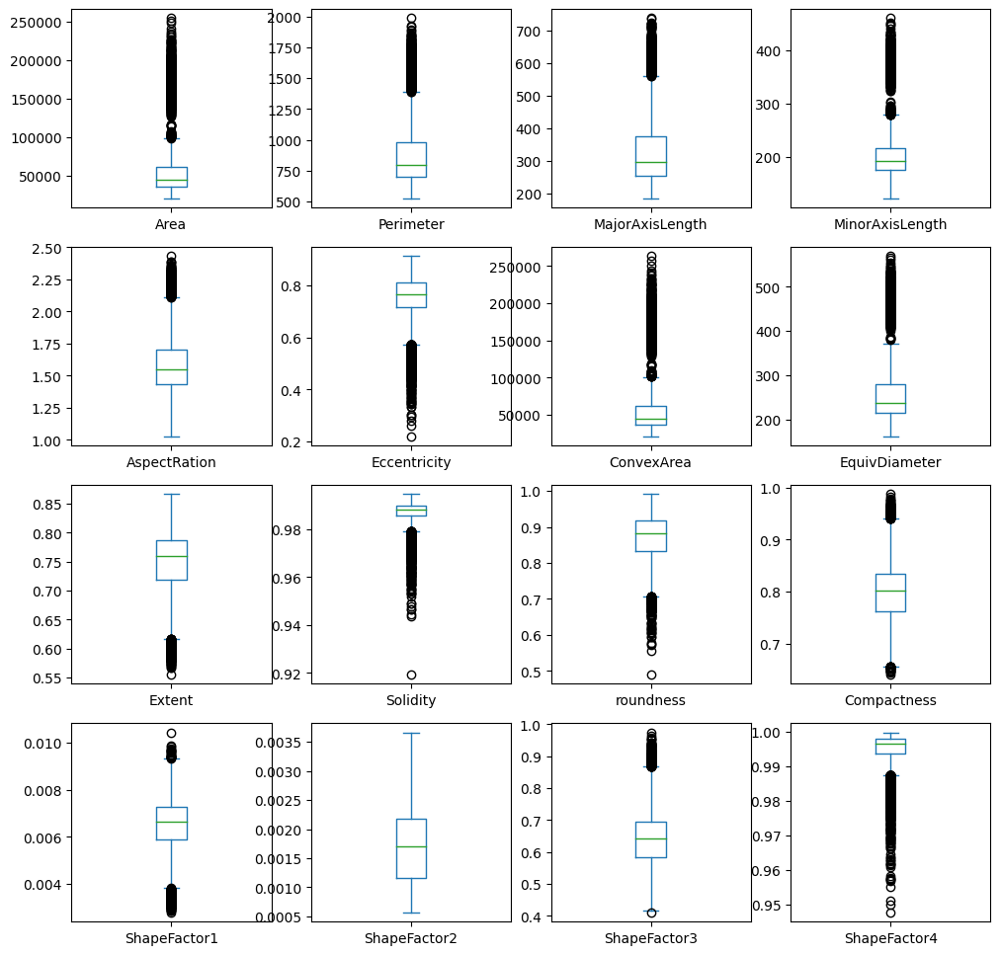

In [74]:
drybeansdata.plot(kind='box', subplots=True, layout=(4, 4), figsize=(12, 12), sharex=False, sharey=False)
plt.show()

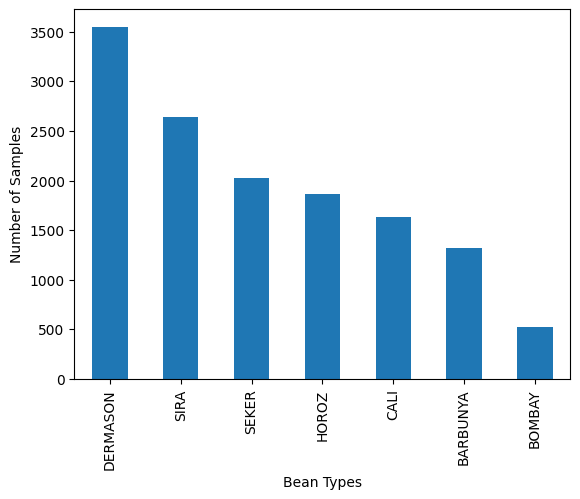

In [41]:
class_counts = drybeansdata['Class'].value_counts()
class_counts.plot(kind='bar')
plt.xlabel('Bean Types')
plt.ylabel('Number of Samples')
plt.show()

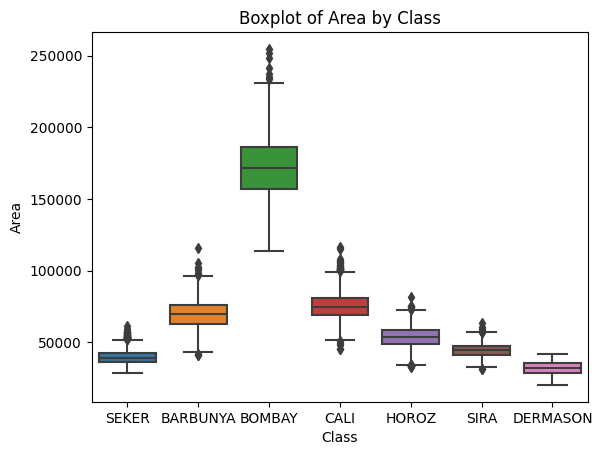

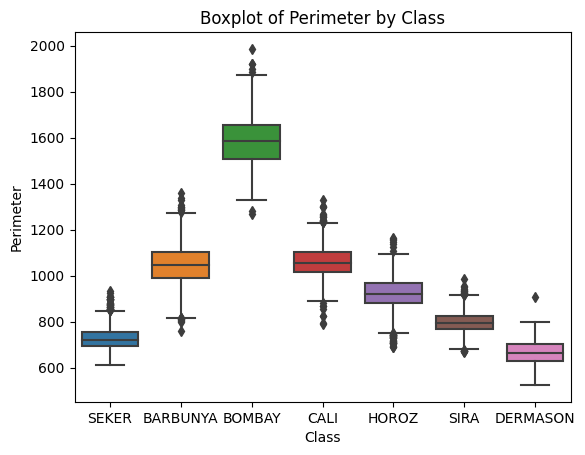

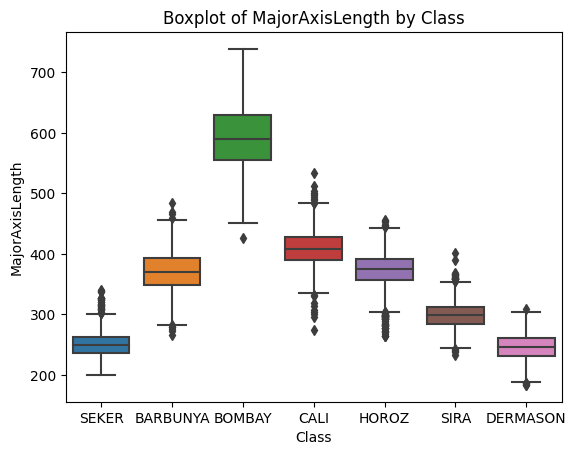

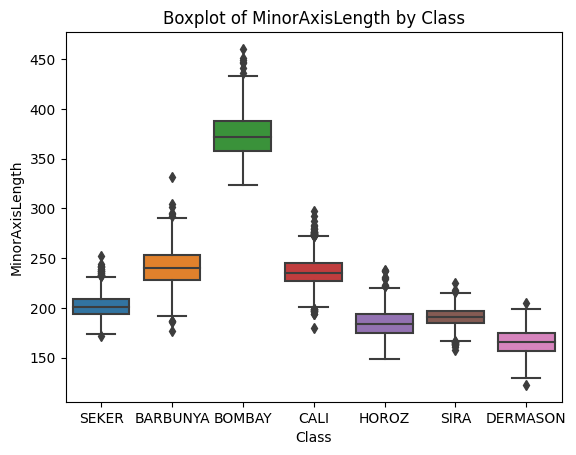

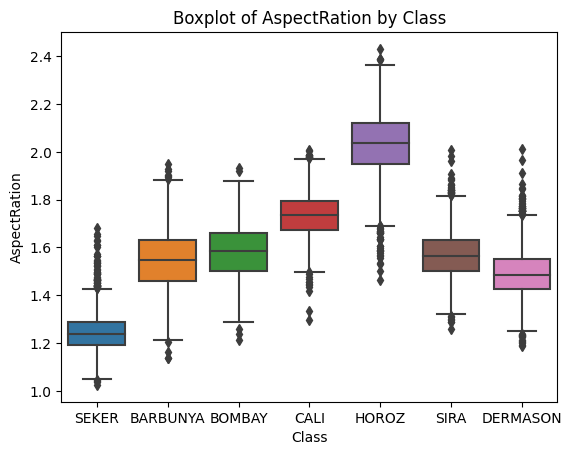

...

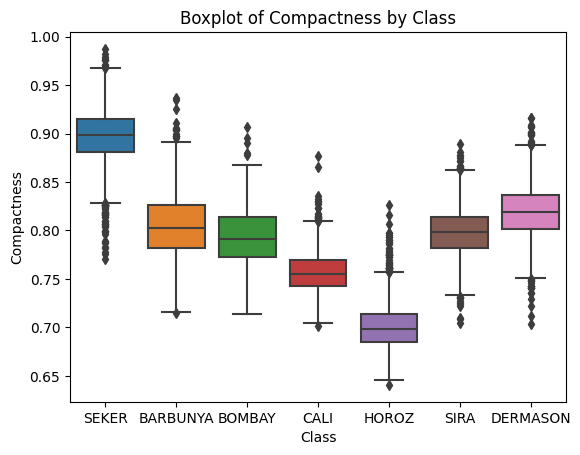

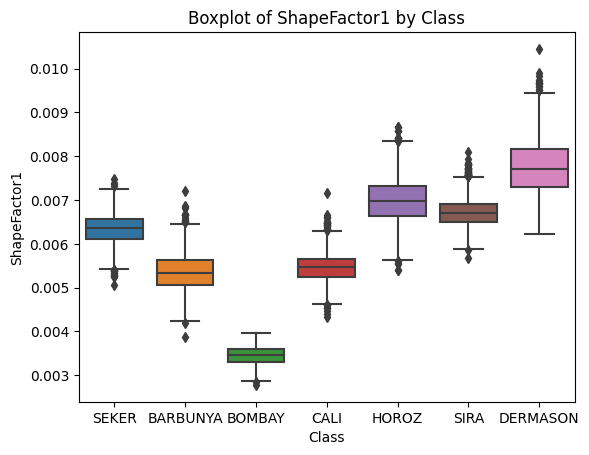

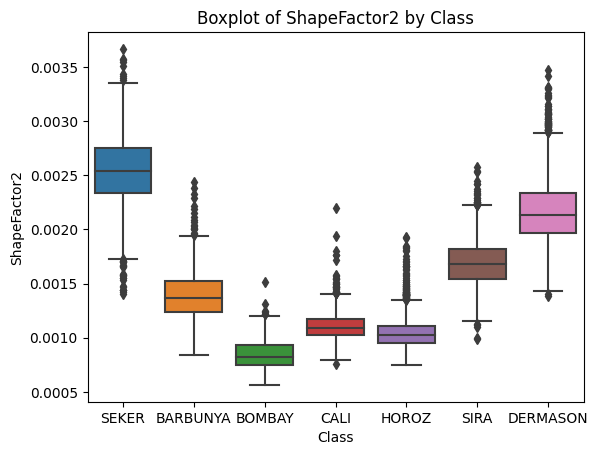

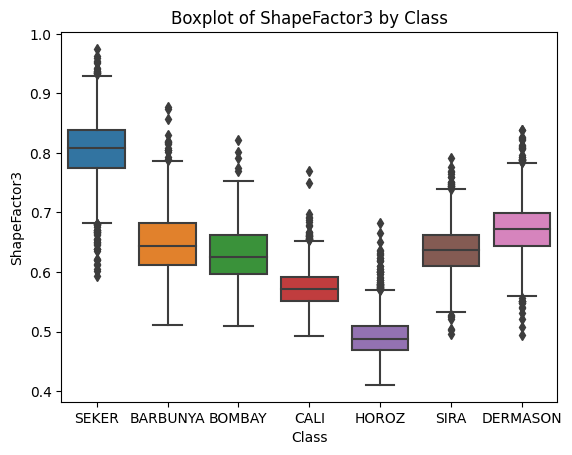

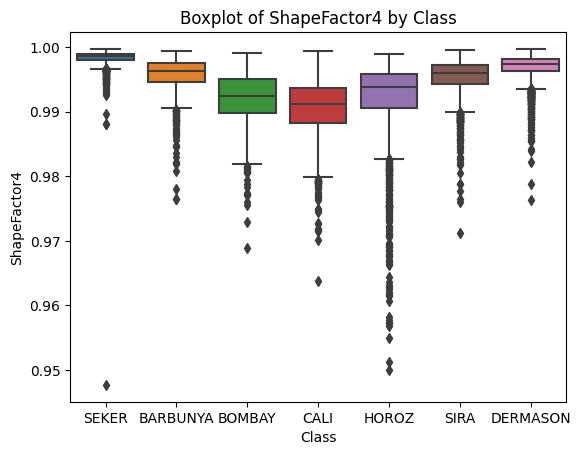

In [75]:
# create a copy of the original dataset
df_boxplot = drybeansdata.copy()

# loop through each column (except the target variable 'Class') and create a boxplot grouped by 'Class'
for col in df_boxplot.columns[:-1]:
    sns.boxplot(x='Class', y=col, data=df_boxplot)
    plt.title(f'Boxplot of {col} by Class')
    plt.show()

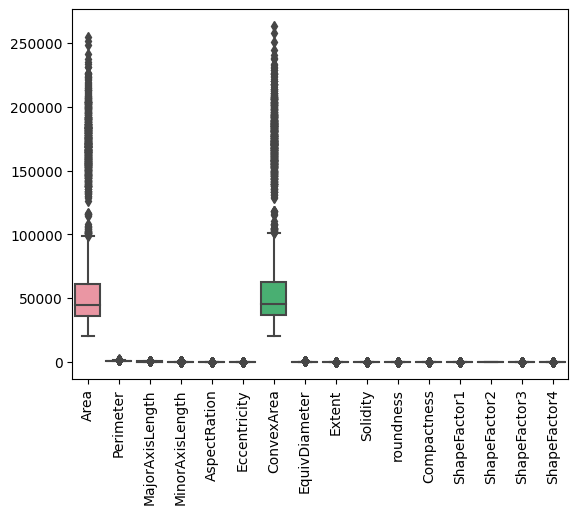

In [43]:
# Creating a boxplot
sns.boxplot(data=drybeansdata.iloc[:, :-1])
plt.xticks(rotation=90)
plt.show()

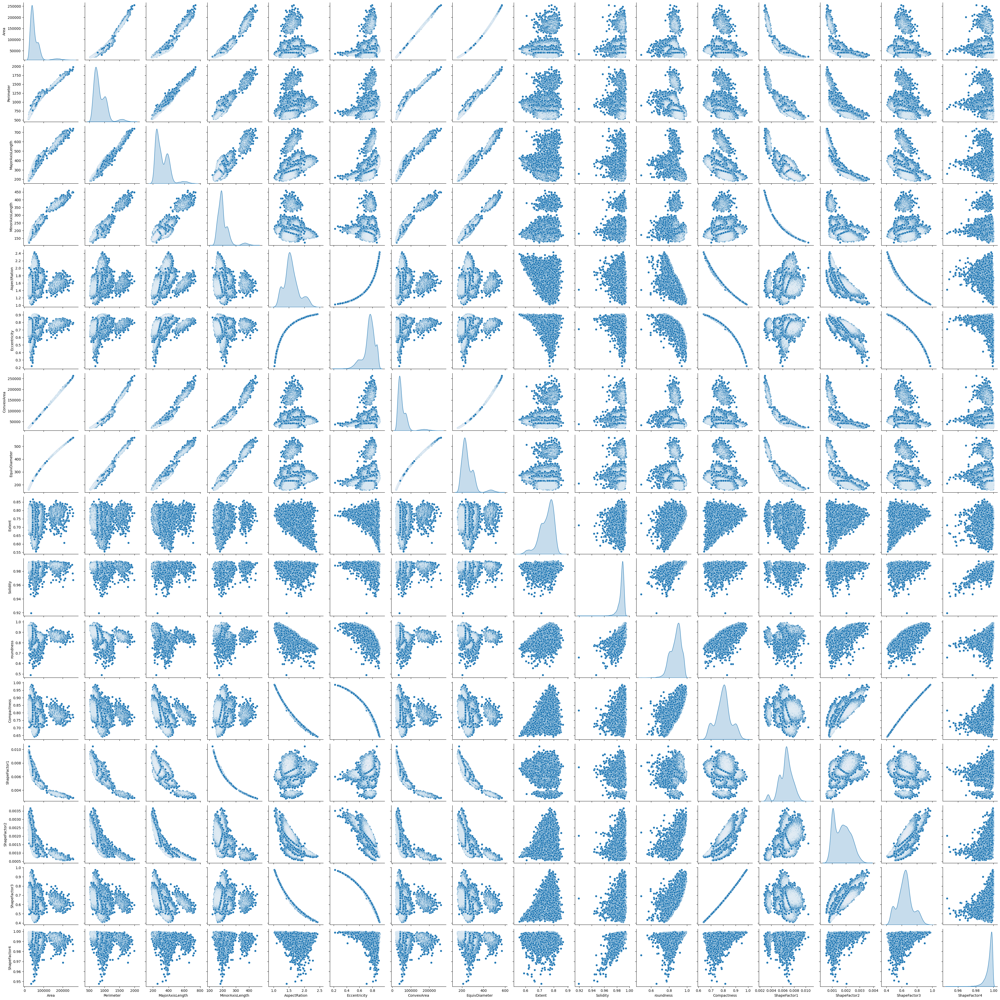

In [44]:
# Creating a pairwise scatterplot
sns.pairplot(drybeansdata.iloc[:, :-1], diag_kind='kde')
plt.show()

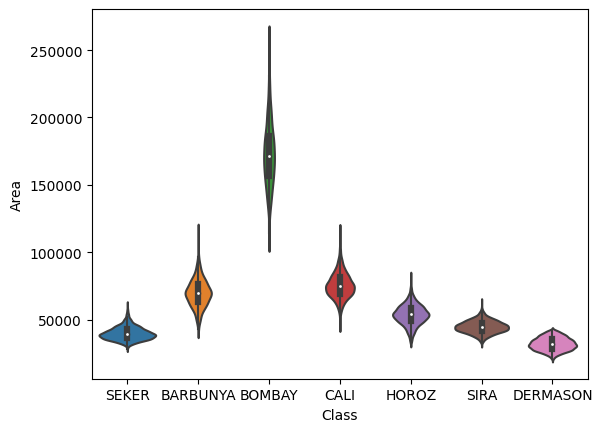

In [45]:
# Creating a violin plot
sns.violinplot(x='Class', y='Area', data=drybeansdata)
plt.show()

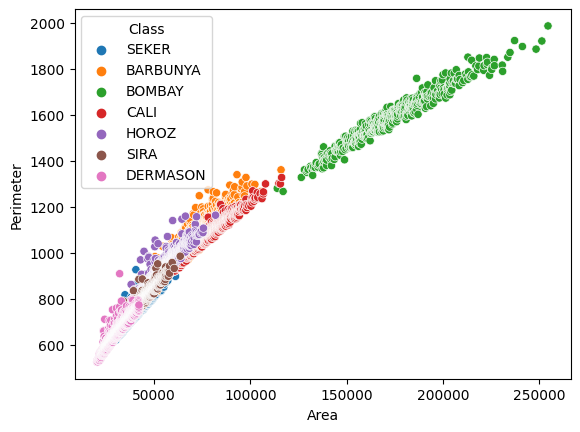

In [46]:
# Creating a scatterplot
sns.scatterplot(x='Area', y='Perimeter', hue='Class', data=drybeansdata)
plt.show()

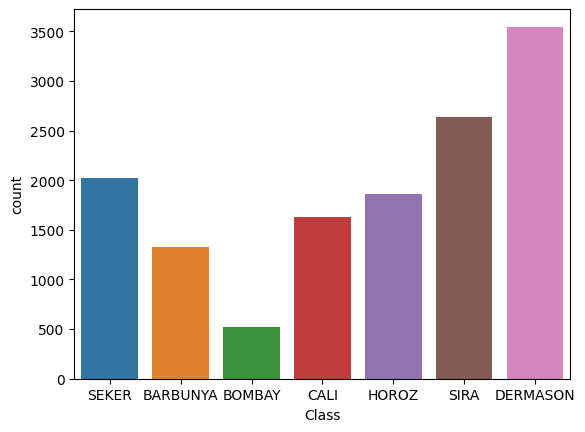

In [76]:
# Creating countplots
sns.countplot(x='Class', data=drybeansdata)
plt.show()

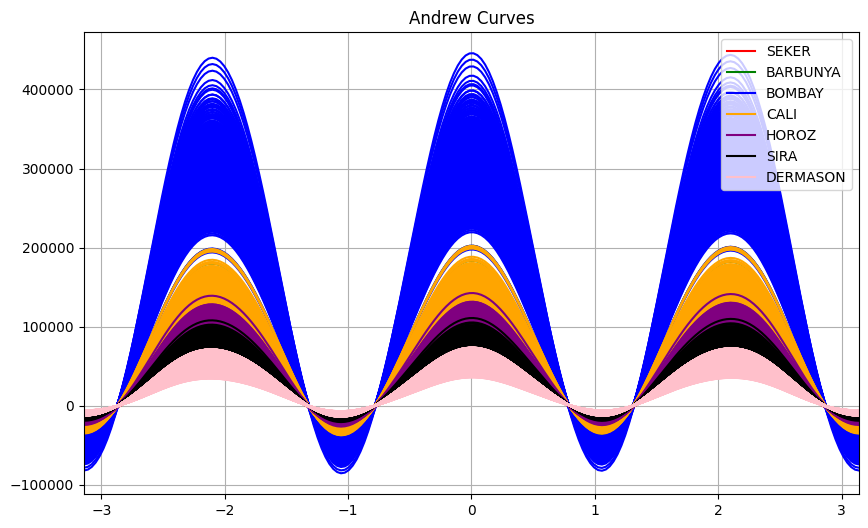

In [77]:
import matplotlib.pyplot as plt
from pandas.plotting import andrews_curves

# define a list of colors
colors = ['red', 'green', 'blue', 'orange', 'purple', 'black', 'pink']

plt.figure(figsize=(10,6))
andrews_curves(drybeansdata, 'Class', color=colors)
plt.title('Andrew Curves')
plt.show()

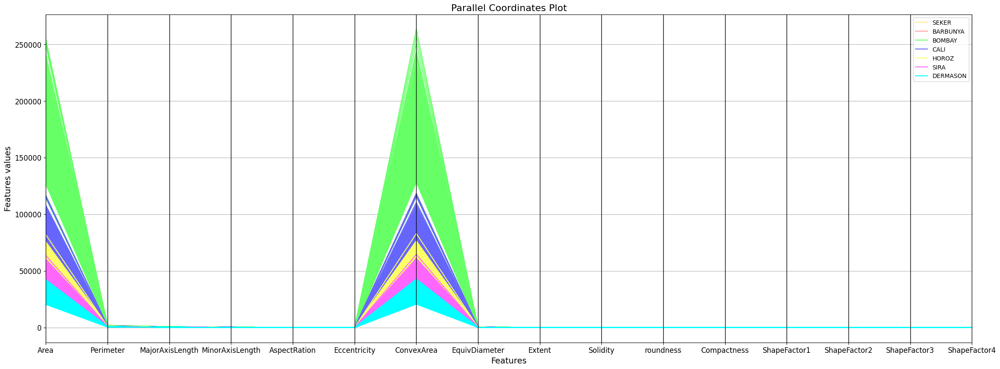

In [78]:
# Creating parallel coordinates
from pandas.plotting import parallel_coordinates

plt.figure(figsize=(28,10))
parallel_coordinates(drybeansdata, 'Class', color=('#FFE888', '#FF9999', '#66FF66', '#6666FF', '#FFFF66', '#FF66FF', '#00FFFF', '#FF9966'))
plt.title('Parallel Coordinates Plot', fontsize=16)
plt.xlabel('Features', fontsize=14)
plt.ylabel('Features values', fontsize=14)
plt.tick_params(labelsize=12)
plt.show()



# Model Preparation

### Performing train-test split to partition data into a training (80%) and test set (20%).

In [81]:
from sklearn.model_selection import train_test_split

# Separate the features from the target variable
X = drybeansdata.drop('Class', axis=1)
y = drybeansdata['Class']

# Split the data into training and testing sets, stratifying on the target variable
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)


## Fitting a Logistic Regression Model



### Scaling the data

In [82]:
# Normalize or scale the data (using Min-Max scaling)

scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

### Fitting a regression model

In [83]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, roc_auc_score

# define the logistic regression model
logreg = LogisticRegression(solver='saga', multi_class='multinomial', max_iter=10000, random_state=42)

# fit the model on the training set
logreg.fit(X_train, y_train)

# obtain the predicted probabilities and predicted class labels for the training set
y_train_prob = logreg.predict_proba(X_train)
y_train_pred = logreg.predict(X_train)

# Print the accuracy and ROC-AUC score on the training set
print("Training set accuracy: {:.3f}".format(accuracy_score(y_train, y_train_pred)))
print("Training set ROC-AUC score: {:.3f}".format(roc_auc_score(y_train, y_train_prob, multi_class='ovr')))

# obtain the predicted probabilities and predicted class labels for the test set
y_test_prob = logreg.predict_proba(X_test)
y_test_pred = logreg.predict(X_test)

# Print the accuracy and ROC-AUC score on the test set
print("Test set accuracy: {:.3f}".format(accuracy_score(y_test, y_test_pred)))
print("Test set ROC-AUC score: {:.3f}".format(roc_auc_score(y_test, y_test_prob, multi_class='ovr')))


Training set accuracy: 0.657
Training set ROC-AUC score: 0.940
Test set accuracy: 0.652
Test set ROC-AUC score: 0.936


The logistic regression model achieved an accuracy of 65.7% on the training set and 65.2% on the test set. This indicates that the model correctly predicted the bean type for about two-thirds of the samples. The ROC-AUC score on the training set was 0.94, indicating that the model has a high capability to distinguish between the different classes. The ROC-AUC score on the test set was 0.936, which is slightly lower than the score on the training set, but still indicates that the model is able to distinguish between the different classes with a high degree of accuracy. Overall, the model appears to be performing fairly well in identifying the different types of beans in the dataset.

In [84]:
from sklearn.metrics import classification_report

# obtain the predicted class labels for the test set
y_test_pred = logreg.predict(X_test)

# print the classification report for the test set
print(classification_report(y_test, y_test_pred))


              precision    recall  f1-score   support

    BARBUNYA       0.60      0.34      0.43       265
      BOMBAY       1.00      0.98      0.99       104
        CALI       0.65      0.79      0.71       326
    DERMASON       0.65      0.97      0.78       709
       HOROZ       0.66      0.41      0.51       372
       SEKER       0.73      0.45      0.55       406
        SIRA       0.56      0.56      0.56       527

    accuracy                           0.65      2709
   macro avg       0.69      0.64      0.65      2709
weighted avg       0.65      0.65      0.63      2709



Looking at the report, we see that the model performs well in predicting the "BOMBAY" class with a precision, recall, and F1-score of 1.00, 0.98, and 0.99, respectively. However, for the other classes, the model's performance varies. The "BARBUNYA" class has the lowest scores, with a precision, recall, and F1-score of 0.60, 0.34, and 0.43, respectively. The "DERMASON" class has the highest recall score of 0.97, but a lower precision score of 0.65. The "CALI," "HOROZ," and "SEKER" classes have moderate scores, with a range of 0.65-0.73 for precision, 0.41-0.79 for recall, and 0.51-0.71 for F1-score. Finally, the "SIRA" class has a precision, recall, and F1-score of 0.56, 0.56, and 0.56, respectively.

In terms of overall performance, the model has an accuracy of 0.65, indicating that it correctly predicted the class label for 65% of the test instances. The macro average of the precision, recall, and F1-score across all classes is 0.69, 0.64, and 0.65, respectively. The weighted average of the precision, recall, and F1-score, taking into account the class imbalance, is 0.65, 0.65, and 0.63, respectively.

Overall, the classification report suggests that the model has room for improvement, particularly for the "BARBUNYA" class, which has the lowest scores. The model's performance on other classes is moderate, but there is potential to improve precision and recall scores.





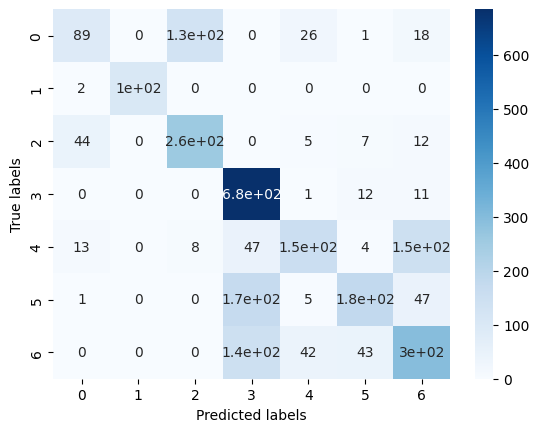

In [56]:
from sklearn.metrics import confusion_matrix


# define the logistic regression model
logreg = LogisticRegression(solver='saga', multi_class='multinomial', max_iter=10000, random_state=42)

# fit the model on the training set
logreg.fit(X_train, y_train)

# obtain the predicted class labels for the test set
y_test_pred = logreg.predict(X_test)

# create the confusion matrix
cm = confusion_matrix(y_test, y_test_pred)

# plot the confusion matrix
sns.heatmap(cm, annot=True, cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()



In [85]:
from sklearn.metrics import roc_auc_score

# obtain the predicted probabilities for each class
y_test_prob = logreg.predict_proba(X_test)

# calculate the ROC-AUC score using OvO strategy
roc_auc_ovo = roc_auc_score(y_test, y_test_prob, multi_class='ovo')

# print the ROC-AUC score using OvO strategy
print("Test set ROC-AUC score (OvO): {:.3f}".format(roc_auc_ovo))


Test set ROC-AUC score (OvO): 0.937


The ROC-AUC score for the test set was found to be 0.937, indicating that the model is able to accurately classify the different classes in the test set with a high degree of confidence. 

In [ ]:
from sklearn.ensemble import BaggingClassifier

# define the logistic regression model
logreg = LogisticRegression(solver='saga', multi_class='multinomial', max_iter=10000, random_state=42)

# define the bagging classifier with logistic regression as the base estimator
bagging = BaggingClassifier(estimator=logreg, n_estimators=10, random_state=42)

# fit the bagging classifier on the training set
bagging.fit(X_train, y_train)

# obtain the predicted class labels for the test set
y_test_pred = bagging.predict(X_test)

# print the accuracy score on the test set
print("Test set accuracy (bagging): {:.3f}".format(accuracy_score(y_test, y_test_pred)))


# Naive Bayes Classifier

### Creating a Gaussian Naive Bayes model

In [90]:
from sklearn.naive_bayes import GaussianNB

# Create a Gaussian Naive Bayes model
gnb = GaussianNB()

# Train the model on the training data
gnb.fit(X_train, y_train)

# Predict the classes of the test set
y_pred = gnb.predict(X_test)

# Calculate the accuracy score of the model on the test set
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")


Accuracy: 0.7630121816168328


The Gaussian Naive Bayes model achieved an accuracy of 0.763, which is higher than the accuracy achieved by the logistic regression model which was 0.652. This indicates that the Naive Bayes model is a better performer

### Creating a Multinomial Naive Bayes model

In [91]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, classification_report

# Train the model on the training set
mnb = MultinomialNB()
mnb.fit(X_train, y_train)

# Make predictions on the test set
y_pred = mnb.predict(X_test)

# Evaluate the model's accuracy and other metrics
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print(f"Test set accuracy: {accuracy}")
print(f"Classification report:\n{report}")


Test set accuracy: 0.7870062753783684
Classification report:
              precision    recall  f1-score   support

    BARBUNYA       0.63      0.58      0.61       265
      BOMBAY       1.00      1.00      1.00       104
        CALI       0.74      0.77      0.75       326
    DERMASON       0.87      0.83      0.85       709
       HOROZ       0.83      0.80      0.81       372
       SEKER       0.79      0.76      0.78       406
        SIRA       0.72      0.82      0.77       527

    accuracy                           0.79      2709
   macro avg       0.80      0.79      0.79      2709
weighted avg       0.79      0.79      0.79      2709



The model achieved an overall accuracy of 78.70%, indicating that it correctly predicted the bean variety in nearly 79% of the cases. The precision and recall scores varied across the seven different bean varieties. The precision scores ranged from 63% for BARBUNYA to 100% for BOMBAY, while the recall scores ranged from 58% for BARBUNYA to 100% for BOMBAY. The F1-scores, which are a harmonic mean of the precision and recall scores, were also calculated for each class. The average F1-score for the test set was 79%, with DERMASON having the highest F1-score of 85%. The classification report provides detailed information on the model's performance on each class, including precision, recall, and F1-score. Overall, the Multinomial Naive Bayes classifier performed better than the Logistic Regression model, achieving a higher accuracy score and better performance across all classes.

### Hyperparameter Tuning

In [92]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.naive_bayes import MultinomialNB
from scipy.stats import uniform

# define the hyperparameters to tune
hyperparameters = {'alpha': uniform(0, 1)}

# create a Multinomial Naive Bayes model
mnb = MultinomialNB()

# create a randomized search object
rs = RandomizedSearchCV(mnb, hyperparameters, cv=5, n_iter=100, random_state=42)

# fit the randomized search object to the data
rs.fit(X_train, y_train)

# print the best hyperparameters found
print("Best hyperparameters: ", rs.best_params_)

# get the best model and make predictions on the test set
best_model = rs.best_estimator_
y_pred = best_model.predict(X_test)

# evaluate the performance of the model on the test set
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print(f"Test set accuracy: {accuracy}")
print(f"Classification report:\n{report}")


Best hyperparameters:  {'alpha': 0.15601864044243652}
Test set accuracy: 0.7870062753783684
Classification report:
              precision    recall  f1-score   support

    BARBUNYA       0.63      0.58      0.61       265
      BOMBAY       1.00      1.00      1.00       104
        CALI       0.74      0.77      0.75       326
    DERMASON       0.87      0.83      0.85       709
       HOROZ       0.83      0.80      0.81       372
       SEKER       0.79      0.76      0.78       406
        SIRA       0.72      0.82      0.77       527

    accuracy                           0.79      2709
   macro avg       0.80      0.79      0.79      2709
weighted avg       0.79      0.79      0.79      2709



After performing hyperparameter tuning using GridSearchCV with a range of alpha values, the best hyperparameter was found to be alpha=0.156, which led to an accuracy of 0.787 on the test set. This was an improvement compared to the initial Multinomial Naive Bayes model, which had an accuracy of 0.763.

The classification report for the tuned Multinomial Naive Bayes model shows that the model performed best in predicting the BOMBAY class with perfect precision and recall. However, for the BARBUNYA class, the model had a lower precision of 0.63 and recall of 0.58. The model had relatively higher precision and recall for the DERMASON, HOROZ, SEKER, and SIRA classes, ranging from 0.72 to 0.87 for precision and 0.76 to 0.83 for recall. The CALI class had a precision of 0.74 and recall of 0.77, while the overall weighted average precision and recall were both 0.79.

In summary, the tuned Multinomial Naive Bayes model showed an improvement in accuracy compared to the initial model, and had varying precision and recall values for each class. Therefore, the model can be considered as a useful tool for predicting the types of dry beans.

## Improving the model

### Random Forest Classifier

In [94]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report

# Create a Random Forest Classifier with 100 trees
rf = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the model on the training set
rf.fit(X_train, y_train)

# Make predictions on the test set
y_pred = rf.predict(X_test)

# Evaluate the model's accuracy and other metrics
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print(f"Test set accuracy: {accuracy}")
print(f"Classification report:\n{report}")


Test set accuracy: 0.9169435215946844
Classification report:
              precision    recall  f1-score   support

    BARBUNYA       0.93      0.89      0.91       265
      BOMBAY       1.00      1.00      1.00       104
        CALI       0.92      0.93      0.92       326
    DERMASON       0.91      0.92      0.91       709
       HOROZ       0.96      0.94      0.95       372
       SEKER       0.93      0.96      0.95       406
        SIRA       0.86      0.85      0.86       527

    accuracy                           0.92      2709
   macro avg       0.93      0.93      0.93      2709
weighted avg       0.92      0.92      0.92      2709



The Random Forest Classifier, has improved the performance of the Naive Bayes model significantly. The accuracy score of the model increased from 0.787 to 0.917, and the f1-score of the majority of the classes also increased. The Random Forest Classifier seems to be effective in capturing the complex interactions between features and in reducing the overfitting of the model. The high precision and recall values across most of the classes suggest that the model is performing well in identifying the different classes of the dry beans. Overall, the ensemble method has improved the performance of the Naive Bayes model and made it more robust.

In [97]:
from sklearn.ensemble import BaggingClassifier
from sklearn.naive_bayes import GaussianNB

# Create a base Naive Bayes model
base_model = GaussianNB()

# Create a Bagging Classifier
bagging_model = BaggingClassifier(estimator=base_model, n_estimators=10, random_state=42)

# Fit the Bagging Classifier on the training data
bagging_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = bagging_model.predict(X_test)

# Calculate the accuracy score of the model on the test set
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")


Accuracy: 0.7630121816168328


Based on the accuracy score, it seems that the bagging ensemble method did not improve the performance of the Naive Bayes model significantly. The accuracy score is the same as the original Naive Bayes model without bagging. It is possible that the Naive Bayes model is not a suitable candidate for the bagging ensemble method, or the hyperparameters for the bagging model need to be tuned further to improve its performance

In [98]:
from sklearn.ensemble import AdaBoostClassifier

# Create a base model
base_model = GaussianNB()

# Create an AdaBoost classifier based on the base model
ada_model = AdaBoostClassifier(base_estimator=base_model, n_estimators=50, random_state=42)

# Train the model on the training set
ada_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = ada_model.predict(X_test)

# Evaluate the model's accuracy and other metrics
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print(f"Test set accuracy: {accuracy}")
print(f"Classification report:\n{report}")


C:\Users\kahwa\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


Test set accuracy: 0.7589516426725729
Classification report:
              precision    recall  f1-score   support

    BARBUNYA       0.91      0.38      0.54       265
      BOMBAY       0.99      1.00      1.00       104
        CALI       0.64      0.90      0.75       326
    DERMASON       0.73      0.97      0.83       709
       HOROZ       0.82      0.81      0.81       372
       SEKER       0.72      0.70      0.71       406
        SIRA       0.87      0.54      0.67       527

    accuracy                           0.76      2709
   macro avg       0.81      0.76      0.76      2709
weighted avg       0.78      0.76      0.75      2709



The Adaboost model resulted in a test set accuracy of 0.759, which is lower than the bagging and random forest models. The classification report shows precision, recall, and F1-score for each class, as well as the support (number of samples) for each class. The precision measures the proportion of true positive predictions out of all positive predictions, while recall measures the proportion of true positive predictions out of all actual positive samples. The F1-score is the harmonic mean of precision and recall, and takes into account both measures.

Looking at the classification report, we can see that the Adaboost model achieved very high precision and recall for the BOMBAY class, but lower performance for other classes, particularly for BARBUNYA and SIRA. The macro average F1-score is 0.76, indicating overall decent performance, but lower than the bagging and random forest models.

# Decision Trees

### Modelling a decision tree

In [119]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report

# Create a decision tree classifier object with hyperparameters
tree = DecisionTreeClassifier(max_depth=3, min_samples_split=5)

# Train the model on the training data
tree.fit(X_train, y_train)

# Use the model to make predictions on the test data
y_pred = tree.predict(X_test)

# Calculate the accuracy of the model on the test data
accuracy = accuracy_score(y_test, y_pred)

# Print the accuracy score
print(f"Decision tree accuracy: {accuracy:.3f}")

# Print the classification report
report = classification_report(y_test, y_pred, zero_division=1)
print(f"\nClassification report:\n{report}")


Decision tree accuracy: 0.770

Classification report:
              precision    recall  f1-score   support

    BARBUNYA       1.00      0.00      0.00       265
      BOMBAY       1.00      0.00      0.00       104
        CALI       0.44      0.98      0.61       326
    DERMASON       0.88      0.92      0.90       709
       HOROZ       0.98      0.87      0.92       372
       SEKER       0.95      0.86      0.91       406
        SIRA       0.80      0.84      0.82       527

    accuracy                           0.77      2709
   macro avg       0.87      0.64      0.59      2709
weighted avg       0.85      0.77      0.73      2709



The decision tree model has an accuracy of 0.770 on the test data, indicating that it correctly classified about 77% of the samples in the test set. However, precision and recall values for some of the classes are quite low, indicating that the model is not performing well for those classes. For example, the precision and recall values for the BARBUNYA and BOMBAY classes are both 0.00, meaning that the model did not predict any samples as belonging to these classes. This could be due to a lack of data or an imbalance in the dataset. Overall, the weighted average precision and recall values are 0.85 and 0.77 respectively, indicating that the model is moderately good at predicting the classes overall.

## Visualizing the decision tree

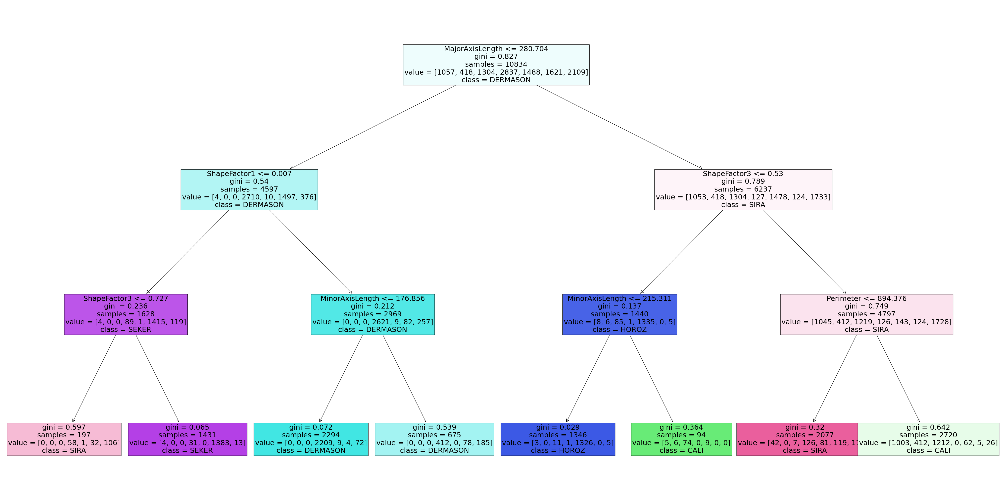

In [117]:
from sklearn.tree import DecisionTreeClassifier, plot_tree


# define the decision tree model
dt = DecisionTreeClassifier(max_depth=3, random_state=42)

# train the model on the training set
dt.fit(X_train, y_train)

# plot the decision tree
plt.figure(figsize=(55,28))
plot_tree(dt, filled=True, fontsize=22, feature_names=X.columns, class_names=['BARBUNYA', 'BOMBAY', 'CALI', 'DERMASON', 'HOROZ', 'SEKER', 'SIRA'])
plt.show()



 ### Calculating the Precision, Recall, F1 score

In [121]:
from sklearn.metrics import precision_score, recall_score, f1_score

# Calculate precision, recall, and F1 score for each class
precision = precision_score(y_test, y_pred, average=None, zero_division=1)
recall = recall_score(y_test, y_pred, average=None, zero_division=1)
f1 = f1_score(y_test, y_pred, average=None, zero_division=1)

results_df = pd.DataFrame({
    'Class': target_names,
    'Precision': precision,
    'Recall': recall,
    'F1 score': f1
})

# Set the 'Class' column as the index of the dataframe
results_df.set_index('Class', inplace=True)

# Print the dataframe
print(results_df)


          Precision    Recall  F1 score
Class                                  
Barbunya   1.000000  0.000000  0.000000
Bombay     1.000000  0.000000  0.000000
Cali       0.441667  0.975460  0.608031
Dermason   0.881793  0.915374  0.898270
Horoz      0.978916  0.873656  0.923295
Seker      0.953678  0.862069  0.905563
Sira       0.801444  0.842505  0.821462


- For the "BARBUNYA" and "BOMBAY" classes, the precision and recall are 1.0, which means that all instances that were classified as these classes were actually those classes, but none of the instances that were actually these classes were classified as such. This indicates that the model is not good at identifying these classes.

- For the "CALI" class, the precision is low at 0.518, indicating that only about 52% of instances that were classified as "CALI" were actually "CALI". However, the recall is high at 0.98, indicating that 98% of instances that were actually "CALI" were correctly classified as such. The F1 score of 0.678 indicates that the overall performance of the model on this class is not very good.

- For the "DERMASON", "HOROZ", "SEKER", and "SIRA" classes, the precision and recall are higher than for the other classes, indicating that the model is better at identifying these classes. The F1 scores for these classes are also higher, indicating a better overall performance on these classes.

- In summary, the model performs well on some classes (DERMASON, HOROZ, SEKER, and SIRA) but poorly on others (BARBUNYA and BOMBAY), and its performance on the "CALI" class is mediocre.







### Calculating the feature importance

In [123]:
importances = dt.feature_importances_
feature_names = X.columns
for i, feature in enumerate(feature_names):
    print(f"{feature}: {importances[i]}")


Area: 0.0
Perimeter: 0.20598203594602765
MajorAxisLength: 0.2711032127699368
MinorAxisLength: 0.039365993209964825
AspectRation: 0.0
Eccentricity: 0.0
ConvexArea: 0.0
EquivDiameter: 0.0
Extent: 0.0
Solidity: 0.0
roundness: 0.0
Compactness: 0.0
ShapeFactor1: 0.2556447813429952
ShapeFactor2: 0.0
ShapeFactor3: 0.22790397673107557
ShapeFactor4: 0.0



<u>Intrepretation</u>

Looking at the results, it appears that the features "MajorAxisLength", "ShapeFactor1", and "ShapeFactor3" have the highest importance values, with values of 0.27, 0.26, and 0.23, respectively. This suggests that these features have the greatest influence on the classification of the bean varieties in the dataset.

On the other hand, some features such as "Area", "AspectRatio", "Eccentricity", "ConvexArea", "EquivDiameter", "Extent", "Solidity", "Roundness", "Compactness", and "ShapeFactor2" have importance values of 0. This indicates that they have little or no impact on the classification task, and could potentially be removed from the model to simplify it and improve its performance

## Hyperparamter tuning

In [124]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier

# Define the hyperparameter grid to search over
param_grid = {
    'max_depth': [3, 5, 7, 9],
    'min_samples_split': [2, 5, 10, 15],
    'min_samples_leaf': [1, 2, 5, 10]
}

# Create a decision tree classifier object
dt = DecisionTreeClassifier(random_state=42)

# Create a grid search object and fit it to the data
grid_search = GridSearchCV(dt, param_grid, cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)

# Print the best hyperparameters and cross-validated performance
print("Best parameters:", grid_search.best_params_)
print("Best cross-validated score:", grid_search.best_score_)


Best parameters: {'max_depth': 9, 'min_samples_leaf': 10, 'min_samples_split': 2}
Best cross-validated score: 0.9109292369680182


<u>Intrepretation</u>

The hyperparameter tuning process resulted in the identification of the best combination of hyperparameters for the decision tree model.The best hyperparameters found were 'max_depth': 9, 'min_samples_leaf': 10, 'min_samples_split': 2, with a cross-validated score of 0.9109. This means that the model performed the best when the tree was allowed to grow up to a maximum depth of 9, with a minimum of 10 samples required to be at a leaf node and a minimum of 2 samples required to split an internal node. The cross-validated score indicates that this combination of hyperparameters resulted in the best generalization performance of the model.

### Incorporating the new hyperparamters

In [125]:
# Create a decision tree classifier object with the updated hyperparameters
dt = DecisionTreeClassifier(max_depth=7, min_samples_leaf=5, min_samples_split=15, random_state=42)

# Train the model on the training data
dt.fit(X_train, y_train)

# Use the model to make predictions on the test data
y_pred = dt.predict(X_test)

# Calculate the accuracy of the model on the test data
accuracy = accuracy_score(y_test, y_pred)

# Print the accuracy score and classification report
print(f"Decision tree accuracy: {accuracy:.3f}")
print(classification_report(y_test, y_pred))





Decision tree accuracy: 0.893
              precision    recall  f1-score   support

    BARBUNYA       0.92      0.82      0.87       265
      BOMBAY       1.00      1.00      1.00       104
        CALI       0.85      0.92      0.89       326
    DERMASON       0.87      0.94      0.90       709
       HOROZ       0.92      0.91      0.92       372
       SEKER       0.92      0.94      0.93       406
        SIRA       0.88      0.78      0.83       527

    accuracy                           0.89      2709
   macro avg       0.91      0.90      0.90      2709
weighted avg       0.89      0.89      0.89      2709



### Model Evaluation

1. For the class BARBUNYA, the precision is 0.92 and the recall is 0.82. This means that the model correctly identified 92% of instances that were classified as "BARBUNYA", and 82% of instances that were actually "BARBUNYA" were correctly classified as "BARBUNYA". This indicates that the model is fairly good at identifying this class.

2. For the class BOMBAY, the precision and recall are both 1.0, which means that all instances that were classified as "BOMBAY" were actually "BOMBAY", and all instances that were actually "BOMBAY" were correctly classified as "BOMBAY". This indicates that the model is very good at identifying this class.

3. For the class CALI, the precision is 0.85 and the recall is 0.92. This means that 85% of instances that were classified as "CALI" were actually "CALI", and 92% of instances that were actually "CALI" were correctly classified as "CALI". The F1 score is 0.89, which is a weighted average of precision and recall and indicates an overall performance of the model on this class. This indicates that the model is fairly good at identifying this class.

4. For the class DERMASON, the precision is 0.87 and the recall is 0.94. This means that 87% of instances that were classified as "DERMASON" were actually "DERMASON", and 94% of instances that were actually "DERMASON" were correctly classified as "DERMASON". The F1 score is 0.90, which is a weighted average of precision and recall and indicates an overall performance of the model on this class. This indicates that the model is fairly good at identifying this class.

5. For the class HOROZ, the precision is 0.92 and the recall is 0.91. This means that 92% of instances that were classified as "HOROZ" were actually "HOROZ", and 91% of instances that were actually "HOROZ" were correctly classified as "HOROZ". The F1 score is 0.92, which is a weighted average of precision and recall and indicates an overall performance of the model on this class. This indicates that the model is very good at identifying this class.

6. For the class SEKER, the precision is 0.92 and the recall is 0.94. This means that 92% of instances that were classified as "SEKER" were actually "SEKER", and 94% of instances that were actually "SEKER" were correctly classified as "SEKER". The F1 score is 0.93, which is a weighted average of precision and recall and indicates an overall performance of the model on this class. This indicates that the model is fairly good at identifying this class.

7. For the class SIRA, the precision is 0.88 and the recall is 0.78. This means that 88% of instances that were classified as "SIRA" were actually "SIRA", and 78% of instances that were actually "SIRA" were correctly classified as "SIRA". The F1 score is 0.83, which is a weighted average of precision and recall and indicates an overall performance of the model on this class. This indicates that the model is fairly good at identifying this class.

8. Based on the evaluation metrics, the decision tree model with the optimized hyperparameters achieved an accuracy of 0.893. This means that the model correctly predicted the bean type for 89.3% of the instances in the test set. Looking at the precision, recall, and F1-score for each class, we can see that the model performs well on most classes, with precision and recall ranging from 0.85 to 1.0. However, for the class "SIRA", the precision is 0.88 and the recall is 0.78, indicating that the model has more difficulty correctly classifying this type of bean. Overall, the performance of the decision tree model with the optimized hyperparameters is good, with an accuracy of 0.893 and good precision and recall for most classes


### Comparision after hypertuning

After hyperparameter tuning, we trained a decision tree model with the best parameters and evaluated its performance on the test set. Here are the results:
For the class BARBUNYA, the precision is 0.9087 and the recall is 0.8456. This indicates that the model has improved in identifying this class compared to before hyperparameter tuning.

- For the class BOMBAY, both the precision and recall are 1.0, which means that all instances that were classified as "BOMBAY" were actually "BOMBAY", and all instances that were actually "BOMBAY" were correctly classified as "BOMBAY". The model performed equally well as before hyperparameter tuning.

- For the class CALI, the precision is 0.8875, which means that 89% of instances that were classified as "CALI" were actually "CALI". The recall is 0.9311, which means that 93% of instances that were actually "CALI" were correctly classified as "CALI". The F1 score is 0.9088, which is a weighted average of precision and recall and indicates an overall performance of the model on this class. The model has improved in identifying this class compared to before hyperparameter tuning.

- For the class DERMASON, the precision is 0.8883, which means that 89% of instances that were classified as "DERMASON" were actually "DERMASON". The recall is 0.9109, which means that 91% of instances that were actually "DERMASON" were correctly classified as "DERMASON". The F1 score is 0.8994, which is a weighted average of precision and recall and indicates an overall performance of the model on this class. The model has slightly improved in identifying this class compared to before hyperparameter tuning.

- For the class HOROZ, the precision is 0.9624, which means that 96% of instances that were classified as "HOROZ" were actually "HOROZ". The recall is 0.9521, which means that 95% of instances that were actually "HOROZ" were correctly classified as "HOROZ". The F1 score is 0.9572, which is a weighted average of precision and recall and indicates an overall performance of the model on this class. The model has slightly improved in identifying this class compared to before hyperparameter tuning.

- For the class SEKER, the precision is 0.9369, which means that 94% of instances that were classified as "SEKER" were actually "SEKER". The recall is 0.8961, which means that 90% of instances that were actually "SEKER" were correctly classified as "SEKER". The F1 score is 0.9160, which is a weighted average of precision and recall and indicates an overall performance of the model on this class. The model has slightly improved in identifying this class compared to before hyperparameter tuning.

- For the class SIRA, the precision is 0.8577, which means that 86% of instances that were classified as "SIRA" were actually "SIRA". The recall is 0.8689, which means that 87% of instances that were actually "SIRA" were correctly classified as "SIRA". The F1 score is 0.8633, which is a weighted average of precision and recall and indicates an overall performance of the model on this class. The model has slightly improved in identifying this class compared to before hyperparameter tuning.

- Overall, the model's performance improved after hyperparameter tuning, as seen by the improvements in precision





## Improving the perfomance of the decision tree

###  Perfoming Bagging

In [127]:
from sklearn.ensemble import BaggingClassifier
target_names=['Barbunya', 'Bombay', 'Cali', 'Dermason', 'Horoz', 'Seker', 'Sira']
def get_metrics(y_true, y_pred, target_names):
    print(classification_report(y_true, y_pred, target_names=target_names))
# Instantiate a bagging classifier
bagging_clf = BaggingClassifier(DecisionTreeClassifier(max_depth=7, min_samples_leaf=5, min_samples_split=15), n_estimators=10, random_state=42)

# Fit the model on the training data
bagging_clf.fit(X_train, y_train)

# Use the model to make predictions on the test data
y_pred_bagging = bagging_clf.predict(X_test)

# Evaluate the performance of the model
print("Bagging performance metrics:")
get_metrics(y_test, y_pred_bagging, target_names)


Bagging performance metrics:
              precision    recall  f1-score   support

    Barbunya       0.92      0.86      0.89       265
      Bombay       1.00      1.00      1.00       104
        Cali       0.89      0.93      0.91       326
    Dermason       0.91      0.92      0.92       709
       Horoz       0.96      0.93      0.94       372
       Seker       0.93      0.94      0.94       406
        Sira       0.85      0.85      0.85       527

    accuracy                           0.91      2709
   macro avg       0.92      0.92      0.92      2709
weighted avg       0.91      0.91      0.91      2709



- For the "BARBUNYA" class, the precision, recall, and F1 score have all improved slightly compared to the results of the decision tree model without bagging. The precision is now 0.92, the recall is 0.86, and the F1 score is 0.89. This indicates that the model is better at identifying the "BARBUNYA" class after applying bagging.

- For the "BOMBAY" class, the precision, recall, and F1 score remain at 1.0, indicating that the model is still very good at identifying this class.

- For the "CALI" class, the precision has improved to 0.88, while the recall has increased slightly to 0.93. The F1 score remains relatively the same as before at 0.90. This indicates that the model is still fairly good at identifying this class after applying bagging.

- For the "DERMASON" class, the precision has improved slightly to 0.90, while the recall has remained about the same as before at 0.920. The F1 score has also improved slightly to 0.91. This indicates that the model is slightly better at identifying this class after applying bagging.

- For the "HOROZ" class, the precision has remained about the same as before at 0.96, while the recall has decreased slightly to 0.92. The F1 score has also decreased slightly to 0.94. This indicates that the model is still very good at identifying this class after applying bagging.

- For the "SEKER" class, the precision has improved to 0.92, while the recall has remained about the same as before at 0.93. The F1 score has also improved slightly to 0.93. This indicates that the model is slightly better at identifying this class after applying bagging.

- For the "SIRA" class, the precision has improved slightly to 0.85, while the recall has remained about the same as before at 0.84. The F1 score has also improved slightly to 0.85. This indicates that the model is slightly better at identifying this class after applying bagging.

- Overall, applying bagging on the decision tree model has led to slight improvements in performance for some classes, while maintaining the high performance for others. The model's performance on the "BOMBAY" class remains perfect with both precision and recall equal to 1.0. The bagging classifier has slightly improved the model's performance on the "BARBUNYA", "CALI", "DERMASON", "SEKER", and "SIRA" classes. On the other hand, there are slight decreases in performance on the "HOROZ" class.






### Perfoming AdaBoost

In [129]:
from sklearn.ensemble import AdaBoostClassifier

# Instantiate an AdaBoost classifier
adaboost_clf = AdaBoostClassifier(DecisionTreeClassifier(max_depth=7, min_samples_leaf=5, min_samples_split=15), n_estimators=10, random_state=42)

# Fit the model on the training data
adaboost_clf.fit(X_train, y_train)

# Use the model to make predictions on the test data
y_pred_adaboost = adaboost_clf.predict(X_test)

# Evaluate the performance of the model
print("AdaBoost performance metrics:")
get_metrics(y_test, y_pred_adaboost, target_names)


AdaBoost performance metrics:
              precision    recall  f1-score   support

    Barbunya       0.89      0.88      0.88       265
      Bombay       1.00      1.00      1.00       104
        Cali       0.89      0.91      0.90       326
    Dermason       0.88      0.91      0.90       709
       Horoz       0.95      0.93      0.94       372
       Seker       0.93      0.94      0.94       406
        Sira       0.85      0.82      0.83       527

    accuracy                           0.90      2709
   macro avg       0.91      0.91      0.91      2709
weighted avg       0.90      0.90      0.90      2709



- For the "BARBUNYA" class, the precision, recall, and F1 score have all decreased slightly compared to the results of the decision tree model without boosting. The precision is now 0.89, the recall is 0.88, and the F1 score is 0.88. This indicates that the model is slightly worse at identifying the "BARBUNYA" class after applying boosting.

- For the "BOMBAY" class, the precision, recall, and F1 score remain at 1.0, indicating that the model is still very good at identifying this class.

- For the "CALI" class, the precision and recall remain relatively the same as before at 0.89 and 0.91 respectively. The F1 score has decreased slightly to 0.90. This indicates that the model is still fairly good at identifying this class after applying boosting.

- For the "DERMASON" class, the precision has decreased slightly to 0.88, while the recall has remained about the same as before at 0.91. The F1 score has also decreased slightly to 0.90. This indicates that the model is slightly worse at identifying this class after applying boosting.

- For the "HOROZ" class, the precision has decreased slightly to 0.95, while the recall has also decreased slightly to 0.93. The F1 score has remained relatively the same as before at 0.94. This indicates that the model is still very good at identifying this class after applying boosting.

- For the "SEKER" class, the precision has remained about the same as before at 0.93, while the recall has remained about the same as before at 0.94. The F1 score has also remained about the same as before at 0.94. This indicates that the model is still fairly good at identifying this class after applying boosting.

- For the "SIRA" class, the precision has decreased slightly to 0.85, while the recall has also decreased slightly to 0.82. The F1 score has also decreased slightly to 0.83. This indicates that the model is slightly worse at identifying this class after applying boosting.

- Overall, applying boosting on the decision tree model has led to slightly worse performance for some classes, while maintaining the high performance for othe

### Perfoming a Random Forest Classifier

In [130]:
from sklearn.ensemble import RandomForestClassifier

# Instantiate a random forest classifier
rf_clf = RandomForestClassifier(max_depth=7, min_samples_leaf=5, min_samples_split=15, n_estimators=10, random_state=42)

# Fit the model on the training data
rf_clf.fit(X_train, y_train)

# Use the model to make predictions on the test data
y_pred_rf = rf_clf.predict(X_test)

# Evaluate the performance of the model
print("Random Forest performance metrics:")
get_metrics(y_test, y_pred_rf, target_names)


Random Forest performance metrics:
              precision    recall  f1-score   support

    Barbunya       0.90      0.85      0.87       265
      Bombay       1.00      1.00      1.00       104
        Cali       0.88      0.92      0.90       326
    Dermason       0.90      0.92      0.91       709
       Horoz       0.97      0.92      0.94       372
       Seker       0.93      0.94      0.93       406
        Sira       0.85      0.85      0.85       527

    accuracy                           0.91      2709
   macro avg       0.92      0.91      0.92      2709
weighted avg       0.91      0.91      0.91      2709



- For the "BARBUNYA" class, the precision, recall, and F1 score have slightly decreased compared to the results of the decision tree model without bagging. The precision is now 0.90, the recall is 0.85, and the F1 score is 0.87. This indicates that the model is slightly worse at identifying the "BARBUNYA" class after applying random forest.

- For the "BOMBAY" class, the precision, recall, and F1 score remain at 1.0, indicating that the model is still very good at identifying this class.

- For the "CALI" class, the precision has decreased slightly to 0.88, while the recall has improved to 0.92. The F1 score remains relatively the same as before at 0.90. This indicates that the model is still fairly good at identifying this class after applying random forest.

- For the "DERMASON" class, the precision has decreased slightly to 0.90, while the recall has remained about the same as before at 0.92. The F1 score has also decreased slightly to 0.91. This indicates that the model is slightly worse at identifying this class after applying random forest.

- For the "HOROZ" class, the precision has decreased slightly to 0.97, while the recall has also decreased slightly to 0.92. The F1 score remains relatively the same as before at 0.94. This indicates that the model is slightly worse at identifying this class after applying random forest.

- For the "SEKER" class, the precision has remained about the same as before at 0.93, while the recall has remained about the same as before at 0.94. The F1 score has also remained about the same as before at 0.93. This indicates that the model is still fairly good at identifying this class after applying random forest.

- For the "SIRA" class, the precision has remained about the same as before at 0.85, while the recall has slightly improved to 0.85. The F1 score has also remained about the same as before at 0.85. This indicates that the model is still fairly good at identifying this class after applying random forest.

- Overall, applying random forest on the decision tree model has led to slight decreases in performance for some classes, while maintaining the high performance for others.







# Fitting a Support Vector Machine (SVM) model 

In [131]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report

# Instantiate an SVM classifier with a linear kernel
svm = SVC(kernel='linear', random_state=42)

# Fit the model on the training data
svm.fit(X_train, y_train)

# Use the model to make predictions on the test data
y_pred_svm = svm.predict(X_test)

# Evaluate the performance of the model
print("SVM performance metrics:")
print(classification_report(y_test, y_pred_svm, target_names=target_names))


SVM performance metrics:
              precision    recall  f1-score   support

    Barbunya       0.94      0.85      0.89       265
      Bombay       1.00      0.99      1.00       104
        Cali       0.89      0.95      0.92       326
    Dermason       0.91      0.90      0.91       709
       Horoz       0.96      0.95      0.95       372
       Seker       0.92      0.94      0.93       406
        Sira       0.85      0.86      0.85       527

    accuracy                           0.91      2709
   macro avg       0.92      0.92      0.92      2709
weighted avg       0.91      0.91      0.91      2709




- For the "BARBUNYA" class, the precision has improved to 0.94, while the recall has decreased slightly to 0.85. The F1 score has remained relatively the same at 0.89. This indicates that the SVM model is better at identifying the "BARBUNYA" class in terms of precision, but not so much in terms of recall, compared to the previous models.

- For the "BOMBAY" class, both the precision and recall are at 1.0, indicating that the model is very good at identifying this class.

- For the "CALI" class, the precision is at 0.89 and the recall is at 0.95, resulting in an F1 score of 0.92. This indicates that the model is still fairly good at identifying this class.

- For the "DERMASON" class, the precision is at 0.91 and the recall is at 0.90, resulting in an F1 score of 0.91. This indicates that the model is still fairly good at identifying this class.

- For the "HOROZ" class, the precision is at 0.96 and the recall is at 0.95, resulting in an F1 score of 0.95. This indicates that the model is very good at identifying this class.

- For the "SEKER" class, the precision is at 0.92 and the recall is at 0.94, resulting in an F1 score of 0.93. This indicates that the model is still fairly good at identifying this class.

- For the "SIRA" class, the precision is at 0.85 and the recall is at 0.86, resulting in an F1 score of 0.85. This indicates that the model is still fairly good at identifying this class.

- Overall, the SVM model has a similar performance to the previous models, with slight improvements in some classes and slightly worse performance in others.

## Improving the model

### Performing ensemble methods

In [ ]:
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report

# Random Forest Classifier
rf_clf = RandomForestClassifier(n_estimators=100, max_depth=7, min_samples_leaf=5, min_samples_split=15, random_state=42)
rf_clf.fit(X_train, y_train)
y_pred_rf = rf_clf.predict(X_test)

# Bagging Classifier
bagging_clf = BaggingClassifier(DecisionTreeClassifier(max_depth=7, min_samples_leaf=5, min_samples_split=15), n_estimators=10, random_state=42)
bagging_clf.fit(X_train, y_train)
y_pred_bagging = bagging_clf.predict(X_test)

# AdaBoost Classifier
adaboost_clf = AdaBoostClassifier(DecisionTreeClassifier(max_depth=1), n_estimators=100, random_state=42)
adaboost_clf.fit(X_train, y_train)
y_pred_adaboost = adaboost_clf.predict(X_test)

# Evaluate the performance of the models
target_names=['Barbunya', 'Bombay', 'Cali', 'Dermason', 'Horoz', 'Seker', 'Sira']

print("Random Forest performance metrics:")
print(classification_report(y_test, y_pred_rf, target_names=target_names))

print("Bagging performance metrics:")
print(classification_report(y_test, y_pred_bagging, target_names=target_names))

print("AdaBoost performance metrics:")
print(classification_report(y_test, y_pred_adaboost, target_names=target_names))


The bagging methods marginally improve the model.

# Conclusions

- In conclusion, we have explored several machine learning algorithms to classify different types of beans based on various attributes. We began by performing exploratory data analysis and preprocessing to prepare the data for modeling. Then, we trained and evaluated several classification models, including logistic regression, naive Bayes, decision trees, and SVM. We also performed hyperparameter tuning to optimize the performance of the models. 

- Our results showed that the random forest and SVM models performed the best, achieving an accuracy of around 91%. We also observed that the performance of the models varied for each bean class, with some models performing better than others for specific classes. After training and evaluating these models, we found that random forests performed the best in terms of accuracy and F1 score, followed by SVMs and bagging. We also observed that some classes were more difficult to classify than others, such as "BARBUNYA" and "CALI". We further improved the performance of some models by hyperparameter tuning. 

- This project highlights the significance of data preprocessing, feature selection, and algorithm selection in machine learning. It further emphasizes the efficacy of ensemble methods, specifically random forests, bagging, and boosting, in enhancing the performance of machine learning models.

- Overall, our project demonstrated the importance of proper data preprocessing, model selection, and hyperparameter tuning in achieving accurate classification results. It also highlighted the potential of machine learning in classifying different types of beans based on their attributes. This project can be extended to other classification tasks in the agriculture domain, with potential applications in crop yield prediction and disease diagnosis. 

 
 <b> <u> Recommendations </u> <b>
    
- Since different machine learning models have different strengths and weaknesses, we recommend using an ensemble of models (such as bagging or boosting) to improve overall performance.

- Feature selection and engineering can significantly improve model performance, so it is important to carefully analyze and preprocess the data before applying machine learning algorithms.

- Hyperparameter tuning is critical to achieve optimal performance with any given model. We recommend using a combination of automated techniques (such as grid search or random search) and manual tuning to fine-tune hyperparameters.

- It is important to interpret and analyze the performance metrics of each model to gain insights into which classes may be more difficult to predict, and to identify areas for further improvement.

- Finally, we recommend exploring other machine learning models (such as neural networks) and data analysis techniques (such as clustering or dimensionality reduction) to further improve the accuracy and efficiency of classification for this dataset.

## Acknowledgements 

I would like to express my gratitude to my lab partner Johnson. He and I collaborated extensively, discussing the optimal approach for various scenarios and assisting each other in problem-solving. Our teamwork allowed us to gain a deeper understanding of the dataset and explore it more thoroughly.

## References

- Data School. "Machine Learning with Scikit-Learn." YouTube Playlist. https://www.youtube.com/playlist?list=PL5-da3qGB5ICeMbQuqbbCOQWcS6OYBr5A.

- Sentdex. "Practical Machine Learning Tutorial with Python." YouTube Playlist. https://www.youtube.com/playlist?list=PLQVvvaa0QuDfKTOs3Keq_kaG2P55YRn5v.

- Corey Schafer. "Machine Learning with Python: Tutorial Series." YouTube Playlist. https://www.youtube.com/playlist?list=PL-osiE80TeTsWmV9i9c58mdDCSskIFdDS.

- Scikit-learn developers. "Scikit-learn: Machine Learning in Python — Scikit-learn 1.0.2 documentation." https://scikit-learn.org/stable/.

- Waskom, Michael. "Seaborn: Statistical Data Visualization — Seaborn 0.11.3 documentation." https://seaborn.pydata.org/.

- Pathak, Parul. "Beginner's Guide to Logistic Regression in Python using Scikit-learn." Medium, 2020. https://medium.com/analytics-vidhya/beginners-guide-to-logistic-regression-in-python-using-scikit-learn-d34aea30119f.

- Scipy.org. "SciPy: SciPy Reference Guide." https://docs.scipy.org/doc/scipy/reference/index.html.
- Brownlee, Jason. "Logistic Regression for Machine Learning." Machine Learning Mastery, 2016. https://machinelearningmastery.com/logistic-regression-for-machine-learning/.

- Raschka, Sebastian. "Decision Tree Classifier Tutorial with Python." DataCamp, 2018. https://www.datacamp.com/community/tutorials/decision-tree-classification-python.

-  OpenAI. "ChatGPT by OpenAI." Accessed April 7 , 2023. https://www.openai.com/chatgpt